# Cell segmentation with cellpose

Cellpose algorithm: [github](https://github.com/MouseLand/cellpose) [paper](https://t.co/kBMXmPp3Yn?amp=1)

Notebook based on: [colab](https://colab.research.google.com/github/MouseLand/cellpose/blob/master/notebooks/Cellpose_cell_segmentation_2D_prediction_only.ipynb)

For challenging images there is also Omnipose model (not used in ths notebook): [paper](https://www.biorxiv.org/content/10.1101/2021.11.03.467199v3) [colab](https://colab.research.google.com/github/HenriquesLab/ZeroCostDL4Mic/blob/master/Colab_notebooks/Beta%20notebooks/Cellpose_2D_ZeroCostDL4Mic.ipynb)

## Installation

In Colab, you need to downgrade opencv-python-headless first

In [ ]:
# !pip install opencv-python-headless==4.1.2.30 #

Install cellpose:

In [ ]:
# !pip install cellpose

## Segmentation

In [1]:
import numpy as np
import time, os, sys, random
from pathlib import Path
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

import shutil

from cellpose import models

Define input, output and expected cell diameter

In [2]:
input_dir = Path('../../03_dane/02_SRS-UJ_Jurkat+THP_2chans_npys/01_npy_cube')
save_dir = Path('../../03_dane/02_SRS-UJ_Jurkat+THP_2chans_npys/02_segmentation')

expected_cell_diameter = 40

Images need to be normalized to floats in \[0-1\] range. Define function to perform image normalization:

In [13]:
def normalize_image_data(img_data):
    """process image data to 1 channel float in 0-1 range"""
    img_data = np.abs(img_data).mean(axis=2)
    img_data /= 10 #img_data.max() #np.quantile(img_data, 0.95)
    return np.clip(img_data, 0, 1)

In [14]:
save_dir.mkdir(exist_ok=True)

In [15]:
import torch
use_GPU = torch.cuda.is_available()
print('use GPU:', use_GPU)

use GPU: True


In [16]:
files=list(input_dir.rglob('*.npy'))

print(f"Number of images loaded: {len(files):d}")
if(len(files)==0):
    print("Cannot read image files. Check if folder has images")


Number of images loaded: 18


No of images loaded are:  18
Example Image:
THP-1_obszar-10.npy has 2 dimensions/s
One Channel
THP-1_obszar-3.npy has 2 dimensions/s
One Channel
Jurkat_obszar-1.npy has 2 dimensions/s
One Channel
THP-1_obszar-5.npy has 2 dimensions/s
One Channel


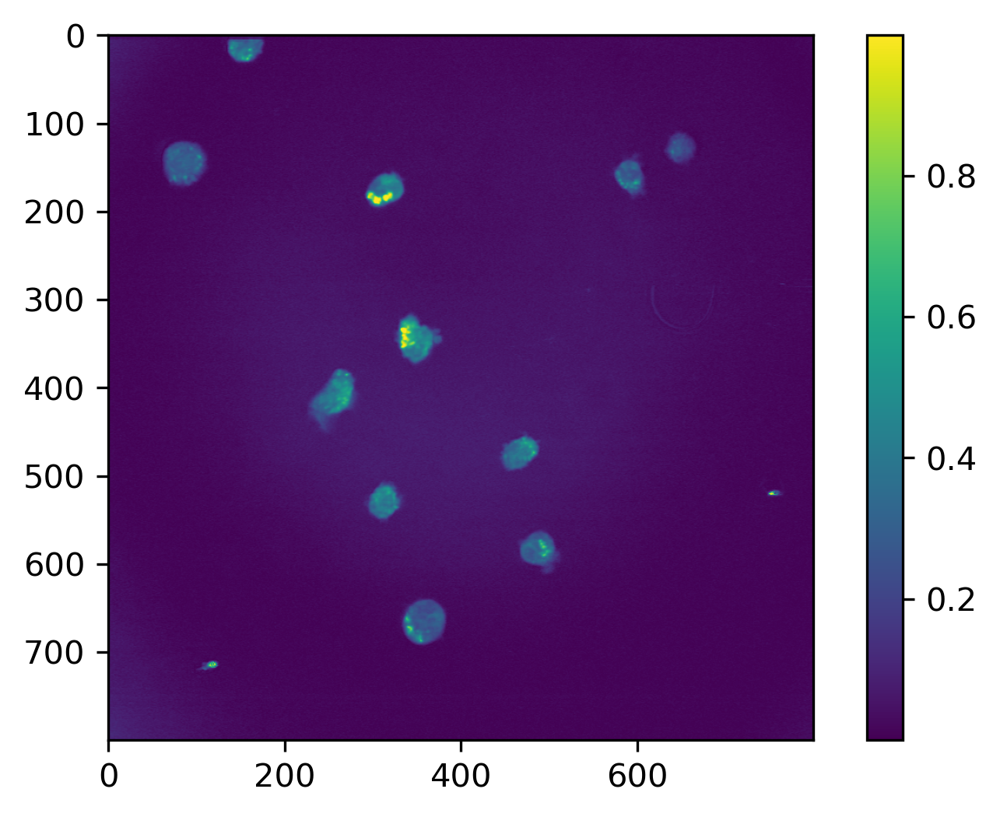

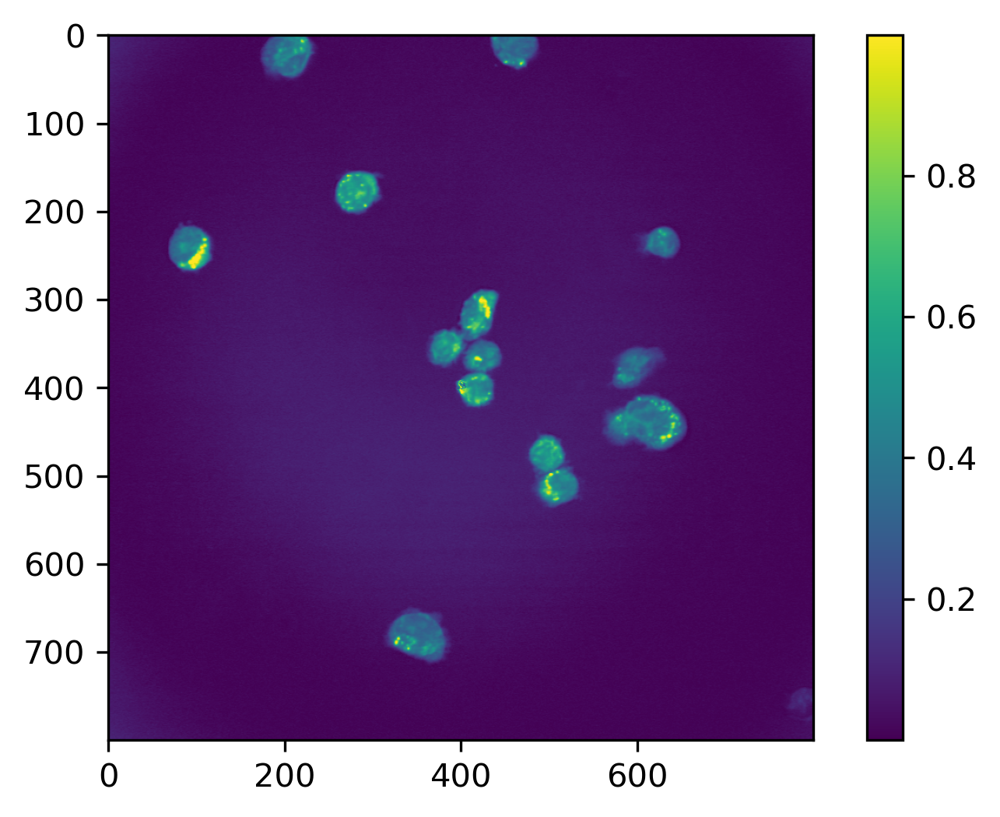

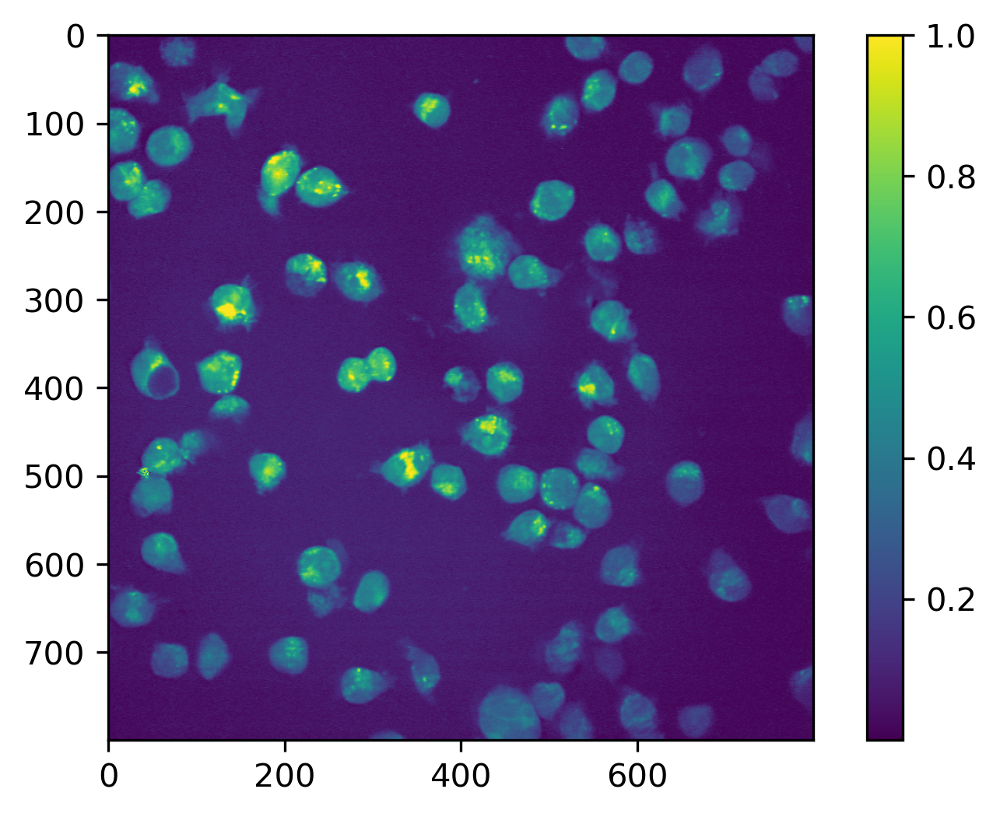

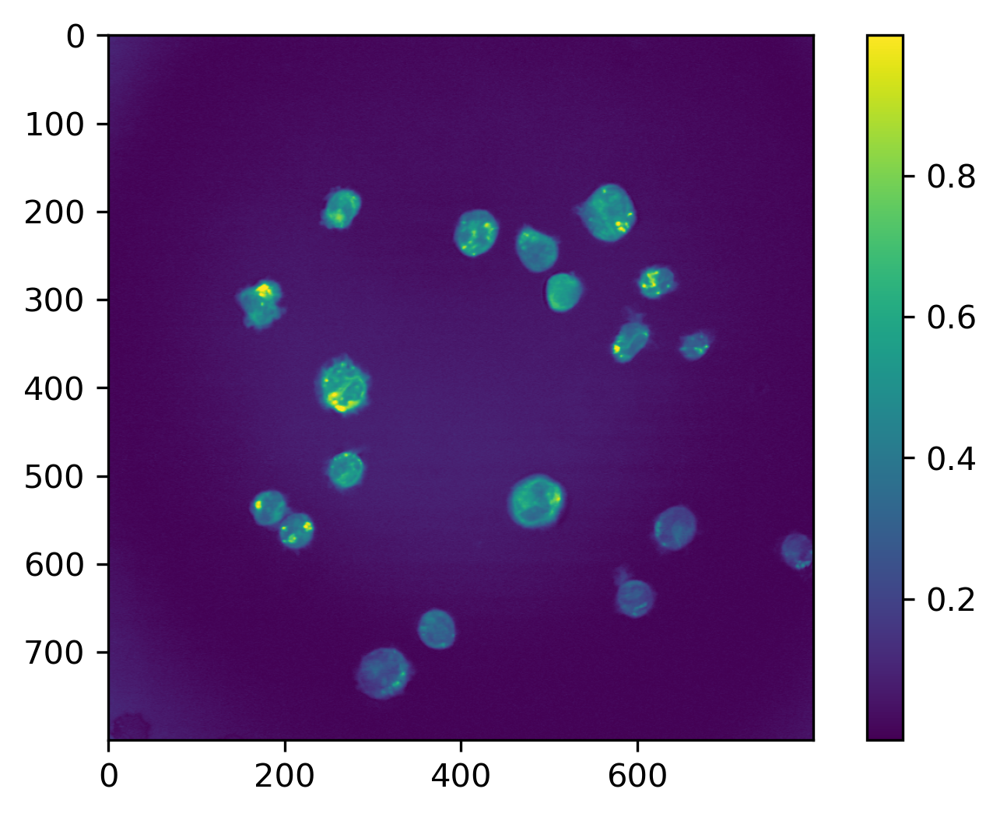

In [17]:
imgs=[] #store all images
imgs_paths = []
#Read images
for f in files:
    imgs_paths.append(f)
    im = normalize_image_data(np.load(f))
    n_dim=len(im.shape) #shape of image
    dim=im.shape #dimensions of image
    channel=min(dim) #channel will be dimension with min value usually
    channel_position=dim.index(channel)
    #if no of dim is 3 and channel is first index, swap channel to last index
    if n_dim==3 and channel_position==0: 
        #print(dim)
        im=im.transpose(1,2,0)
        dim=im.shape
        #print("Shape changed")
    #print(dim)
    imgs.append(im)

nimg = len(imgs)
print("No of images loaded are: ", nimg)

print("Example Image:")

for i in range(4):
    random_idx = random.choice(range(len(imgs)))
    x=imgs[random_idx]
    n_dim=len(x.shape)
    file_name=os.path.basename(files[random_idx])
    print(f"{files[random_idx].name} has {n_dim} dimensions/s")
    if n_dim==3:
        channel_image=x.shape[2]
        fig, axs = plt.subplots(1, channel_image,figsize=(3,3))
        print("Image: %s" %(file_name))
        for channel in range(channel_image):
            axs[channel].imshow(x[:,:,channel])
            axs[channel].set_title('Channel '+str(channel+1),size=5)
            axs[channel].axis('off')
        fig.tight_layout()
    elif n_dim==2:
        fig = plt.figure()
        print("One Channel")
        plt.imshow(x)
        plt.colorbar()
    else:
        print("Channel number invalid or dimensions wrong. Image shape is: "+str(x.shape))



---


# **Run Cellpose**



####**Step 5**. Choose the model based on what you want to segment, Cytoplasm to segment whole cell if there is a cytoplasmic marker. 
####Choose nucleus to segment the nuclei.
#### If you are using cytoplasm model and have a nuclear channel, this will assist with *segmentation*


In [18]:
Model_Choice = "Cytoplasm" #@param ["Cytoplasm", "Nucleus"]
model_choice=Model_Choice

#@markdown If the image has only one channel, leave it as 0
Channel_for_segmentation="0" #@param[0,1,2,3]
segment_channel=int(Channel_for_segmentation)

if model_choice=="Cytoplasm":
    model_type="cyto"
else:
    model_type="nuclei"

# @markdown ###If you choose cytoplasm, tick if you have a nuclear channel
Use_nuclear_channel= False #@param {type:"boolean"}
Nuclear_channel="3" #@param[1,2,3]
nuclear_channel=int(Nuclear_channel)

#Added this option at the start so it depends on the whether notebook has access to the GPU or not
## @markdown ###Tick if you want to use GPU for segmentation tasks
#Use_GPU = True #@param {type:"boolean"}
#use_GPU=Use_GPU

#@markdown ### Diameter of cell (pixels):
#@markdown #### Enter 0 if you don't know and cellpose will estimate it automatically. You can define this later as well.
Diameter = expected_cell_diameter#@param {type:"number"}
diameter=Diameter

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus



# channels = [cytoplasm, nucleus]
if model_choice is "Cytoplasm":
    if Use_nuclear_channel:
        channels=[segment_channel,nuclear_channel]
    else:
        channels=[segment_channel,0]

if model_choice is "Nucleus":
    channels=[segment_channel,0]


# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type=model_type)

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images
if diameter is 0:
    diameter = None
    print("Diameter is set to None. The size of the cells will be estimated on a per image basis")

####**Step 6: Test cellpose on an image. You can tune the parameters below based on your image** 

The cell below gives you an opportunity to test different parameters and figure out the right combination that gives your output of interest

The ***Flow_threshold parameter*** is  the  maximum  allowed  error  of  the  flows  for  each  mask.   The  default  is 0.4. 

*   **Increase** this threshold if cellpose is not returning as many masks as you’d expect

*   **Decrease** this threshold if cellpose is returning too many ill-shaped masks. 

The ***Cell Probability Threshold*** determines proability that a detected object is a cell.   The  default  is 0.0. 

*   **Decrease** this threshold if cellpose is not returning as many masks as you’d expect or if masks are too small

*   **Increase** this threshold if cellpose is returning too many masks esp from dull/dim areas. 

If you do not know **diameter** of the cells OR if cells are of varying diameters, enter 0 in the Diameter box and cellpose will automatically estimate the diameter

For more information on the parameters: https://cellpose.readthedocs.io/_/downloads/en/latest/pdf/

In [19]:
print([os.path.basename(f) for f in imgs_paths])

['Jurkat_obszar-1.npy', 'Jurkat_obszar-2.npy', 'Jurkat_obszar-3.npy', 'Jurkat_obszar-4.npy', 'Jurkat_obszar-5.npy', 'Jurkat_obszar-6.npy', 'Jurkat_obszar-7.npy', 'Jurkat_obszar-8.npy', 'THP-1_obszar-1.npy', 'THP-1_obszar-10.npy', 'THP-1_obszar-2.npy', 'THP-1_obszar-3.npy', 'THP-1_obszar-4.npy', 'THP-1_obszar-5.npy', 'THP-1_obszar-6.npy', 'THP-1_obszar-7.npy', 'THP-1_obszar-8.npy', 'THP-1_obszar-9.npy']


cellprob_threshold and dist_threshold are being deprecated in a future release, use mask_threshold instead


Image: Jurkat_obszar-3


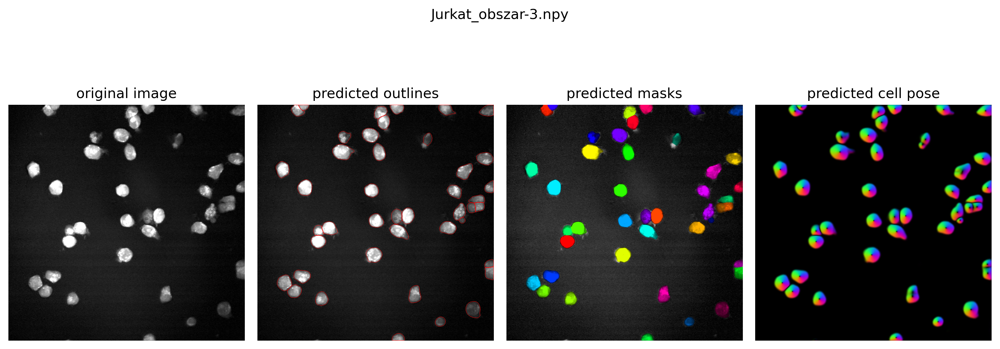

In [20]:
from skimage.util import img_as_ubyte

Image_Number =  3#@param {type:"number"}
Image_Number-=1 #indexing starts at zero
#print(Image_Number)
Diameter = expected_cell_diameter#@param {type:"number"}
#Flow_Threshold=0.4#@param {type:"number"}
Flow_Threshold = 0.4 #@param {type:"slider", min:0.1, max:1.1, step:0.1}
flow_threshold=Flow_Threshold

#Cell_Probability_Threshold=-5#@param {type:"number"}
#Using slider to restrict values
Cell_Probability_Threshold=0 #@param {type:"slider", min:-6, max:6, step:1}
cellprob_threshold=Cell_Probability_Threshold


diameter=Diameter
if diameter is 0:
    diameter = None
if Image_Number is -1:
    Image_Number=0
    #print("Image_Number is set to zero, opening first image.")
try:
    image = imgs[Image_Number]
except IndexError as i:
    print("Image number does not exist",i)
    print("Actual no of images in folder: ",len(imgs))
print("Image: %s" %(os.path.splitext(os.path.basename(files[Image_Number]))[0]))
img1=imgs[Image_Number]

import cv2

masks, flows, styles, diams = model.eval(img1, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)



# DISPLAY RESULTS
from cellpose import plot
maski = masks
flowi = flows[0]

#convert to 8-bit if not so it can display properly in the graph
if img1.dtype!='uint8':
    img1=img_as_ubyte(img1)

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img1, maski, flowi, channels=channels)
fig.suptitle(os.path.basename(imgs_paths[Image_Number]))
plt.tight_layout()
plt.show()

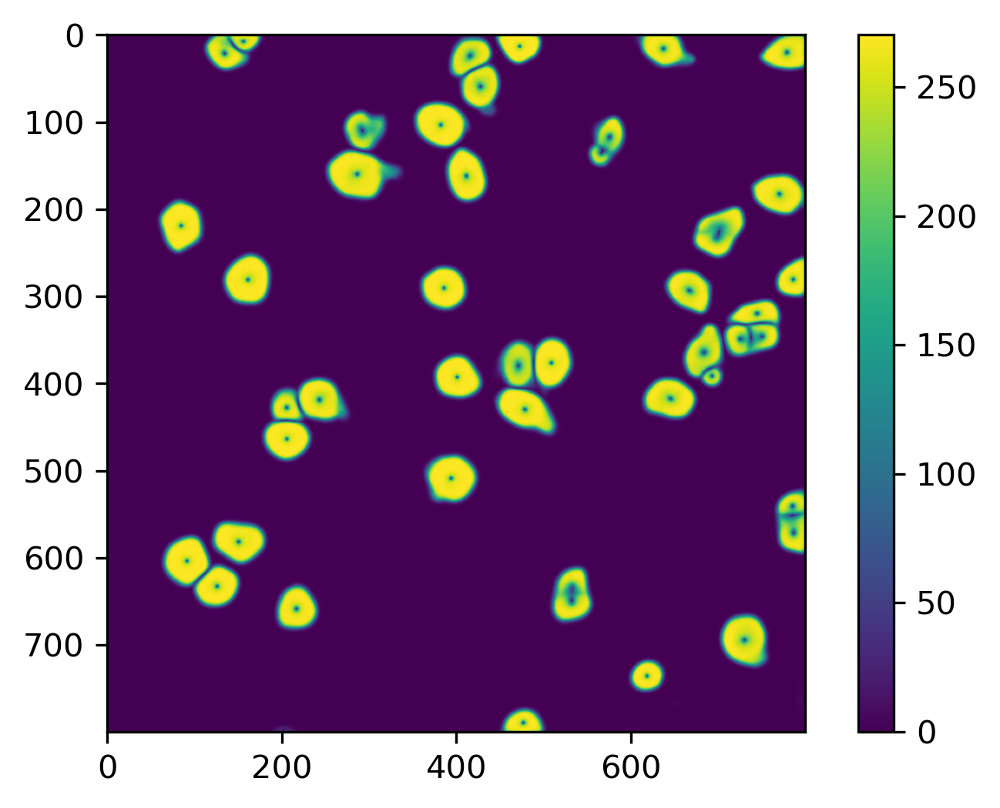

In [21]:
plt.imshow(np.linalg.norm(flowi, axis=2))
plt.colorbar()



---


## **USE CELLPOSE TO SEGMENT CELLS**
The values defined above will be used for segmentation.

The masks will be saved automatically.

Saving the flow image/s are optional. Tick if you want to save them.



In [22]:
#@markdown ### **Step 7. Run Cellpose on folder of images**

#@markdown ###Tick if you want to save the flow image/s: 
Save_Flow= False #@param {type:"boolean"}
#@markdown ##### *Flow image will be resized when saved
save_flow=Save_Flow

#@markdown ###Tick if you want to save the tif masks: 
Save_Tif= False #@param {type:"boolean"}
#@markdown ##### *Flow image will be resized when saved
save_tif=Save_Tif

print("Running segmentation on channel %s" %(segment_channel))
print("Using the model: ",model_choice)
if diameter is None:
    print("Diameter will be estimated from the image/s")
else:
    print(f"Cellpose will use a diameter of {diameter}")

print(f"Using a flow threshold of: {flow_threshold} and a cell probability threshold of: {cellprob_threshold}")

masks, flows, styles, diams = model.eval(imgs, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)



cellprob_threshold and dist_threshold are being deprecated in a future release, use mask_threshold instead


Running segmentation on channel 0
Using the model:  Cytoplasm
Cellpose will use a diameter of 40
Using a flow threshold of: 0.4 and a cell probability threshold of: 0


In [23]:
#save images in folder with the diameter value used in cellpose
print("Segmentation Done. Saving Masks and flows now")
print("Save Directory is: ",save_dir)
if (not os.path.exists(save_dir)):
    os.mkdir(save_dir)

if save_flow:
    print("Saving Flow")
    flows_save_dir=save_dir / "flows"
    flows_save_dir.mkdir(exist_ok=True)
    print("Save Directory for flows is: ",flows_save_dir)


for idx,mask in enumerate(masks):
    file_name = files[idx].stem
    #Output name for masks
    mask_output_name=save_dir / f"MASK_{file_name}.npy"
    np.save(mask_output_name, mask)

    if save_tif:
        mask_output_name=save_dir / f"MASK_{file_name}.tif"
        #Save mask as 16-bit in case this has to be used for detecting than 255 objects
        mask=mask.astype(np.uint16)
        #Save flow as 8-bit
        skimage.io.imsave(mask_output_name,mask, check_contrast=False)
    if save_flow:
        #Output name for flows
        flow_output_name=flows_save_dir / f"FLOWS_{file_name}.tif"
        #Save as 8-bit
        flow_image=flows[idx][0].astype(np.uint8)
        skimage.io.imsave(flow_output_name,flow_image, check_contrast=False)

print("Files saved")

Segmentation Done. Saving Masks and flows now
Save Directory is:  ..\..\03_dane\02_SRS-UJ_Jurkat+THP_2chans_npys\02_segmentation_2
Files saved


In [24]:
print(mask)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


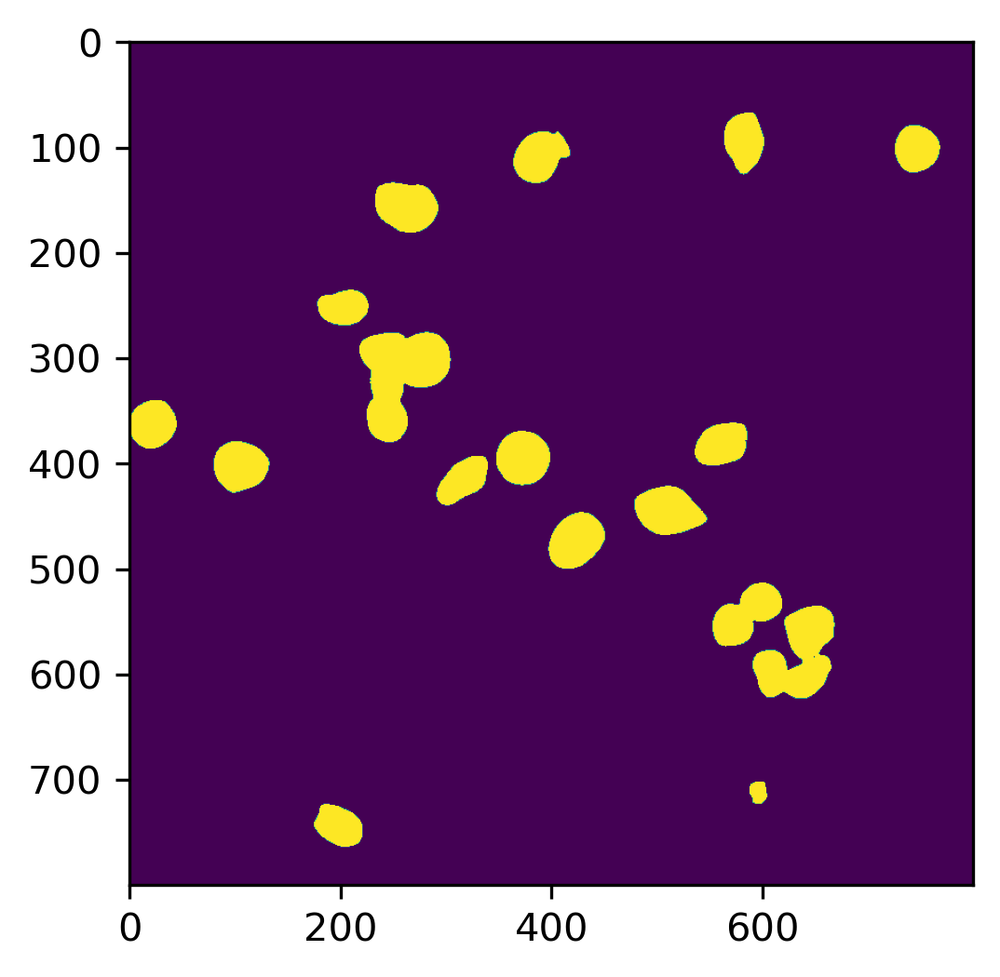

In [25]:
plt.imshow(mask!=0)

---
#**How to extract the ROIs from the mask or label maps using FIJI**

The masks will be saved as a 16-bit label image, where each cell/ROI is a different colour or label. If you are using ImageJ/FIJI and want to convert this to ROIs for the ROI Manager, there are a few options to convert into ROIs:


*   SCF plugin (Update site:	https://sites.imagej.net/SCF-MPI-CBG/). After [installing the plugin](https://imagej.net/How_to_follow_a_3rd_party_update_site), go to SCF-> Segmentation -> LabelMap to ROI Manager (2D). This should generate the ROIs in ROI Manager

*   Another really nice plugin: [LabelsToROIs](https://github.com/ariel-waisman/LabelsToROis). It has some nice features to adjust the size of the ROIs and generate measurements  


###**Save Files as *.npy**

If you want to save the files so as to view it in the Cellpose GUI, you can save it as an *_seg.npy files in colab that you can download and open in the GUI.

The file/s will be saved in the Input_Directory


In [26]:
#@markdown ### **Run this cell to save output of the model as an npy file**
from cellpose import io


output_files = [save_dir / file_in.name for file_in in files]
#save output of model eval to be loaded in GUI
io.masks_flows_to_seg(imgs, masks, flows, diams, output_files, channels)



---
**Acknowledgments:**

Thanks to Lior Pytowski from University of Oxford for testing this notebook out and giving some really good suggestions


### Visualize masks


In [27]:
from PIL import Image

In [28]:
output_visualized_dir = Path(save_dir) / 'visualization'
output_visualized_dir.mkdir(exist_ok=True, parents=True)

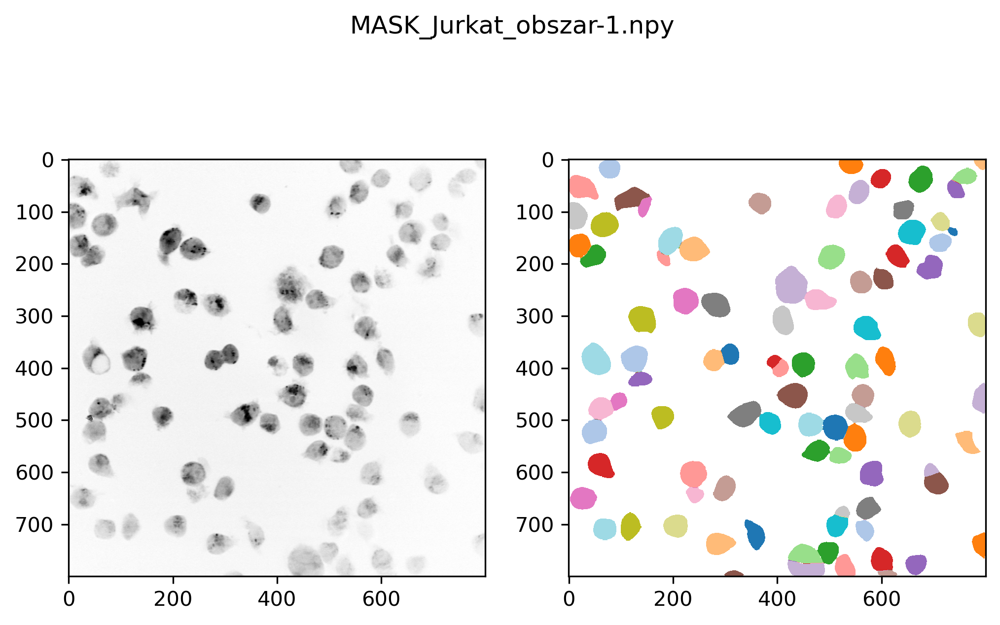

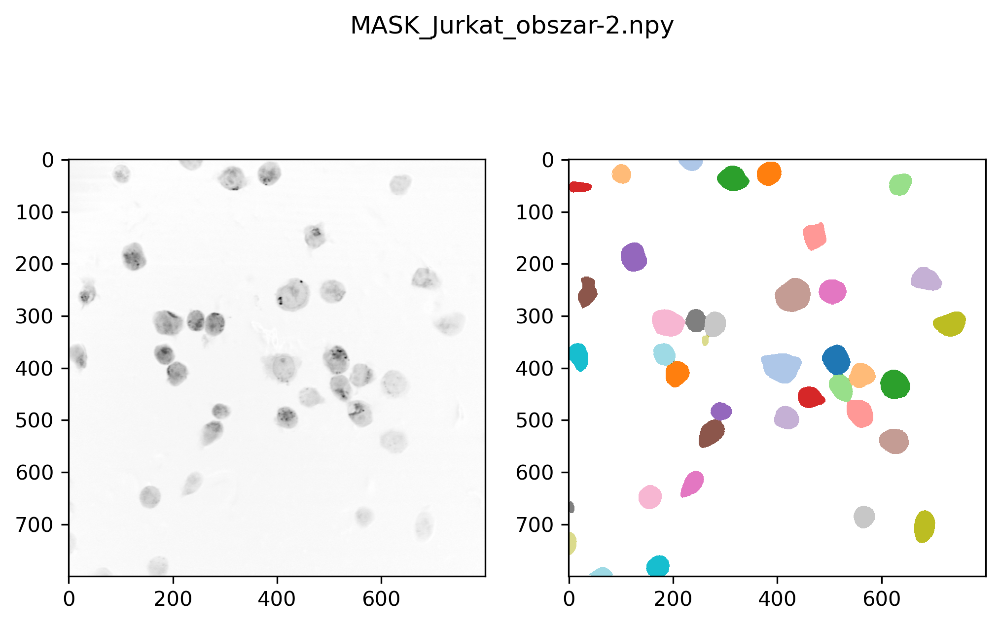

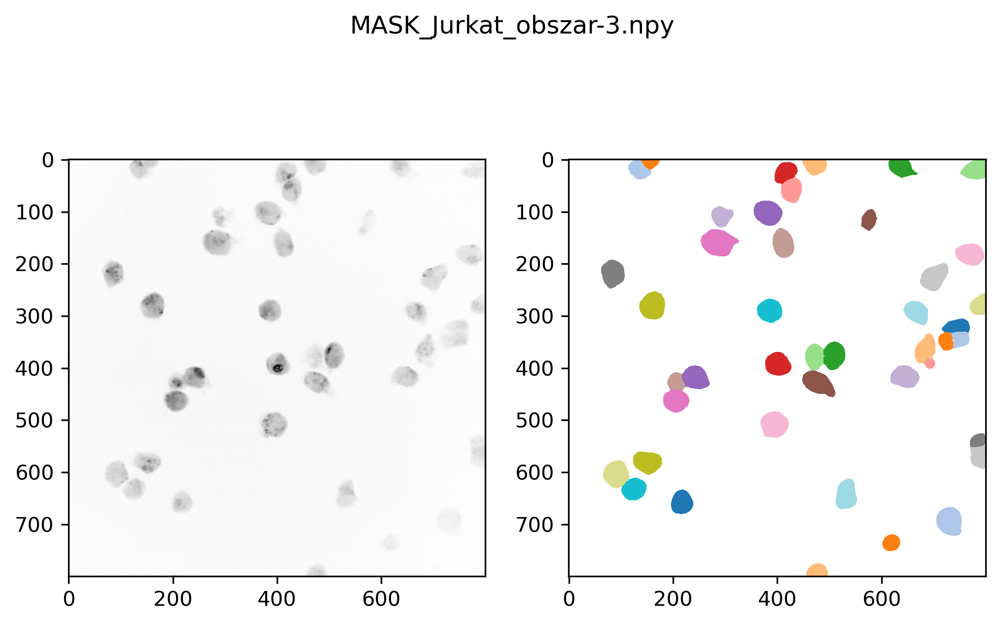

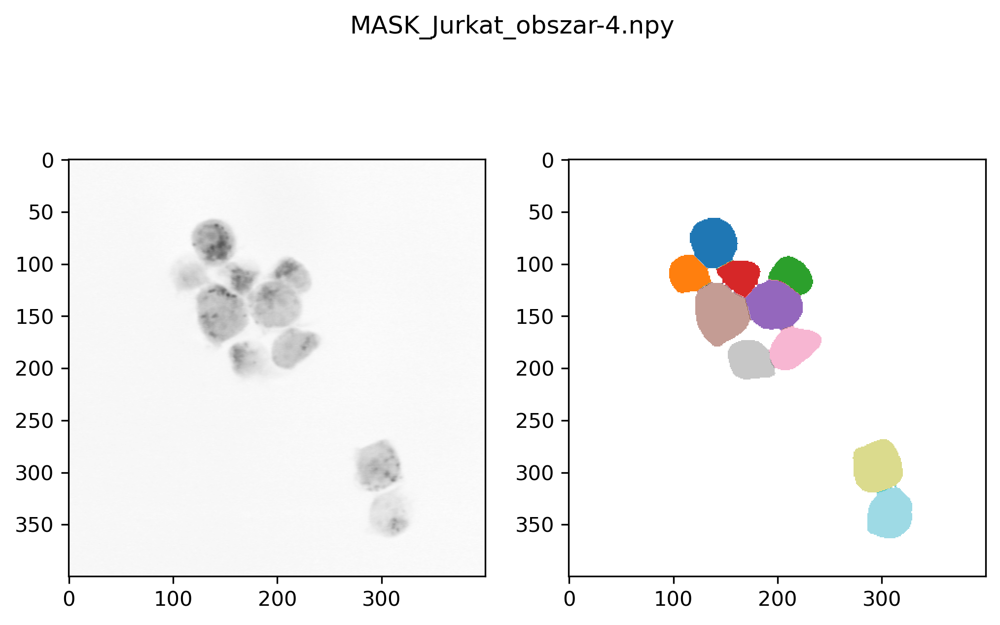

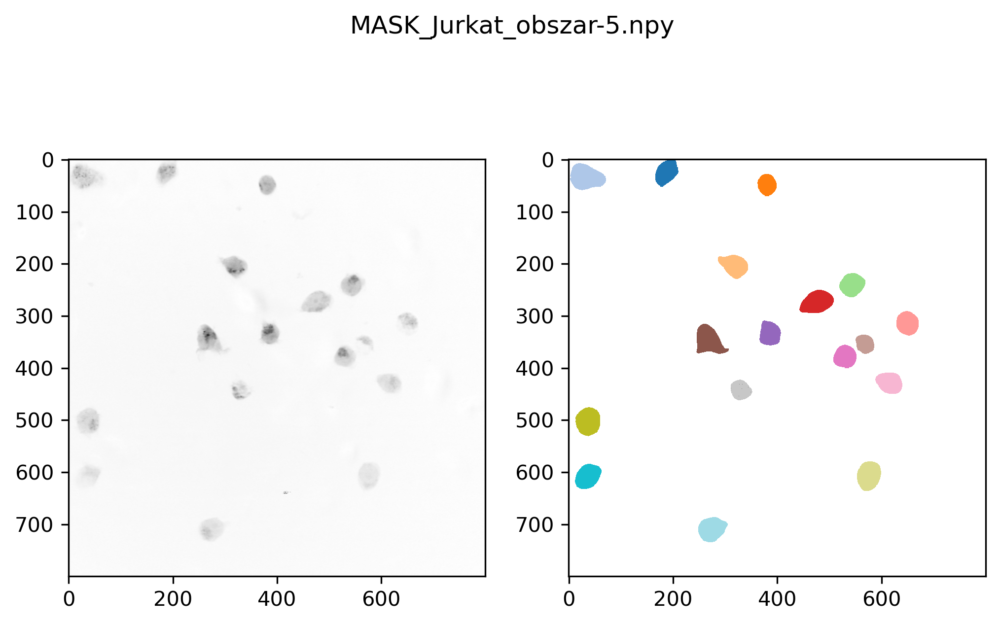

...

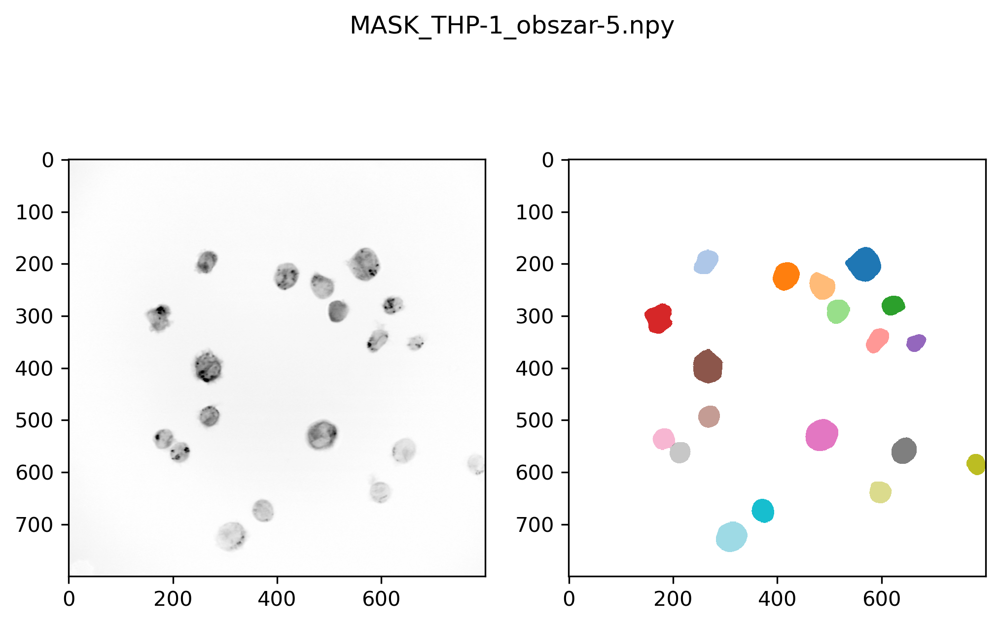

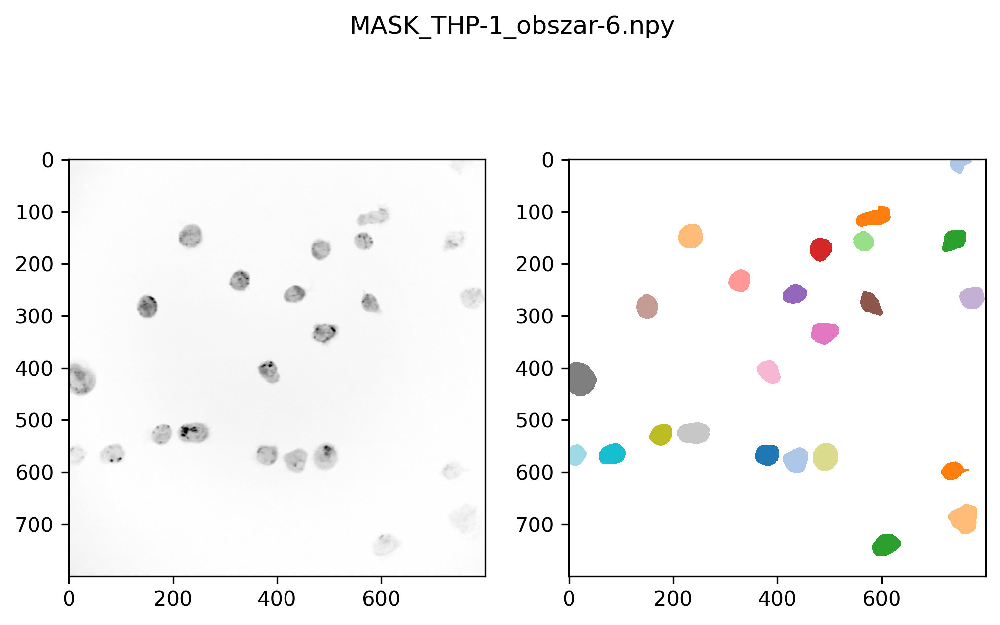

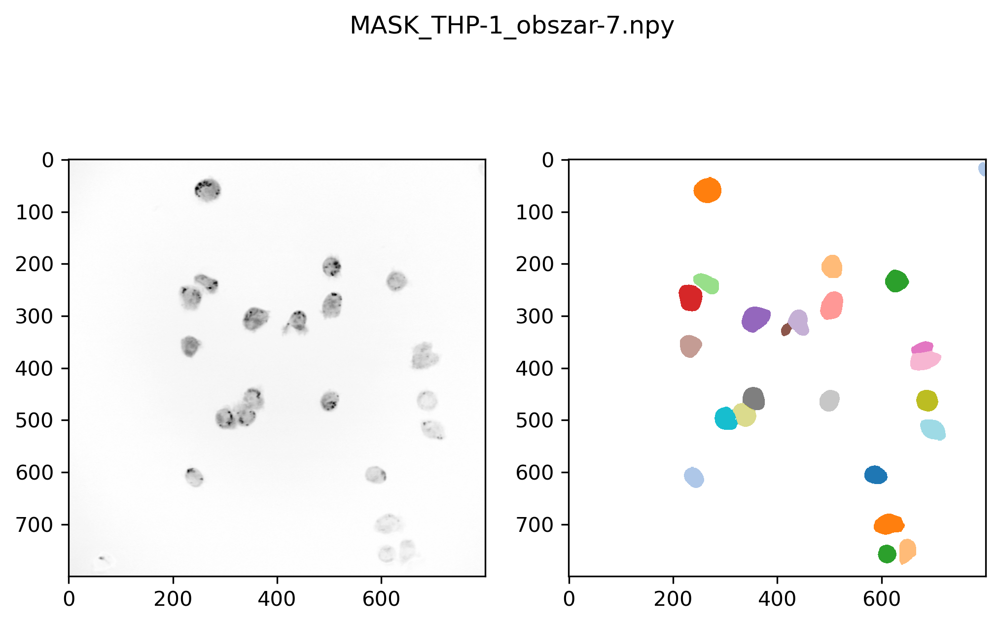

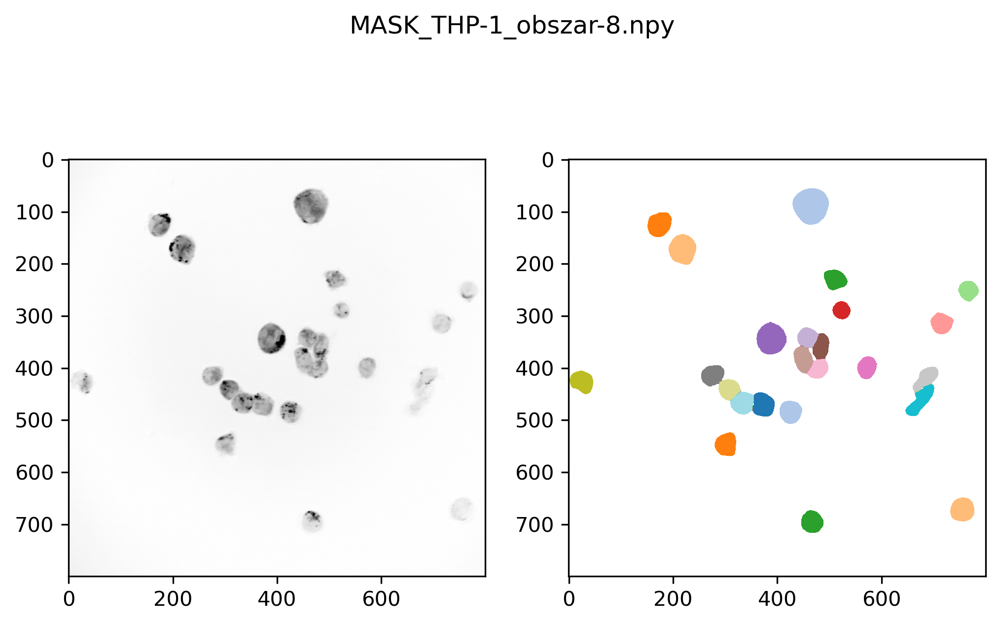

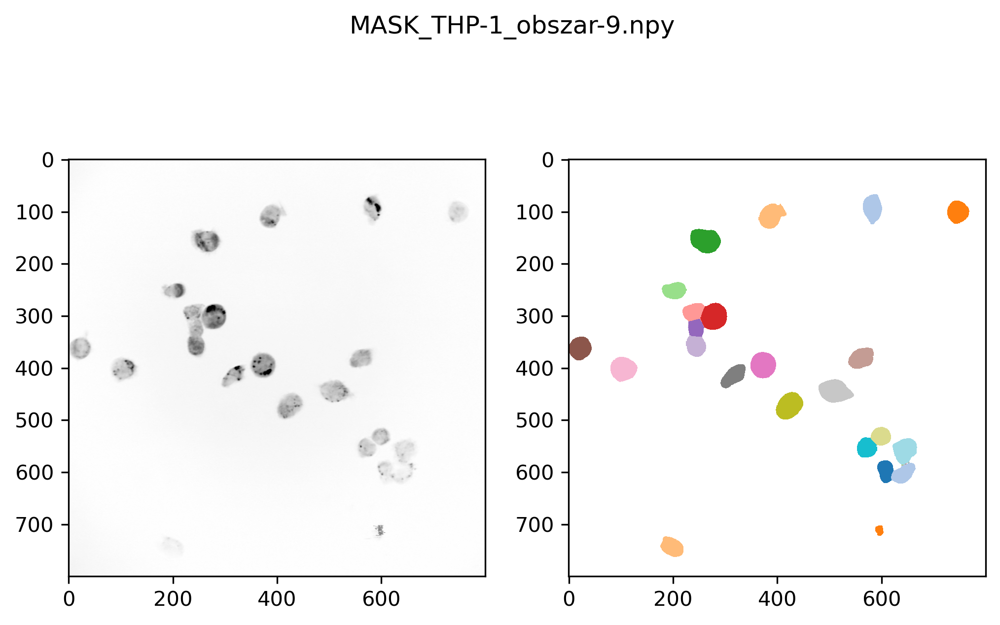

In [29]:
for fn in Path(save_dir).glob('MASK*npy'):
    segmented = np.load(fn)
    fig, axs = plt.subplots(ncols=2, figsize=(8,5))
    axs[1].imshow(np.ma.masked_where(segmented==0, segmented % 20), cmap='tab20')
    fn_img = Path(input_dir) / (fn.name[5:-4]+'.npy') # [5:] to skip 'MASK_'
    img = normalize_image_data(np.load(fn_img))
    axs[0].imshow(img, cmap='Greys', vmin=0, vmax=1)
    fig.suptitle(fn.name)
    fig.savefig(output_visualized_dir / (fn.name[:-4] + '.png'), dpi=300)
  